# Laboratory 2: Basic programing for computer vision II

## 1. Read/Show/Write an Image

### 1.1. Read and Write Image
For typical Python code, you may write the code on the .py file like this:

In [1]:
# import cv2
# import sys

# img = cv2.imread("Images/capybara.png")

# if img is None:
#     sys.exit("Could not read the image.")

# cv2.imshow("Display window", img)
# k = cv2.waitKey(0)

# if k == ord("s"):
#     cv2.imwrite("Results/t1-1.jpg", img)
    
# cv2.destroyAllWindows()

For Jupyter Notebook code, we cannot use the HighGUI in OpenCV. So, we have to use other python library (such as matplotlib) for showing an image instead

In [2]:
import cv2
import sys

img = cv2.imread("Images/lenna.png")

if img is None:
    sys.exit("Could not read the image.")

### 1.2. Show Color Image by matplotlib

In [3]:
# cv2.imshow() is not suitable for notebook style programing.
# Instead, we use matplotlib to show image on jupyter notebook

import matplotlib.pyplot as plt

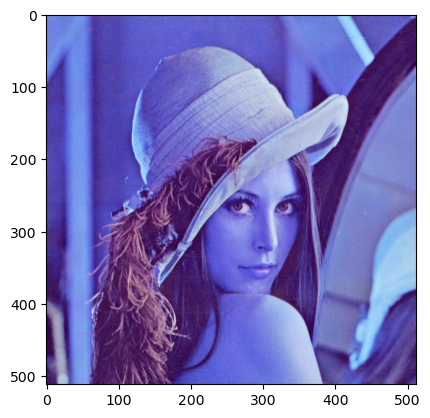

In [4]:
# display the image
plt.imshow(img) 
plt.show()

### 1.3. Grayscale Conversion

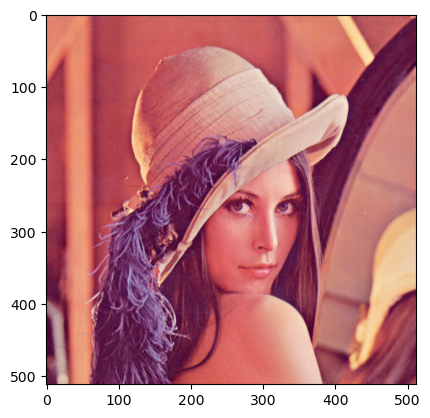

In [5]:
# display the image
img_plt = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #We ned to convert RGB(OpenCV) to BGR(matplotlib) color model
plt.imshow(img_plt) 
plt.show()

### 1.4. Show Grayscale Image by matplotlib

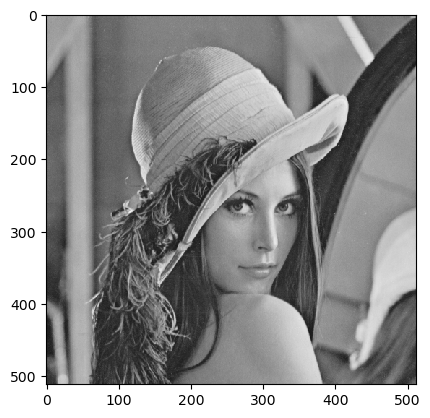

In [8]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## 2. Image Properties

### 2.1. Seeing inside Matrix


In [7]:
print(img)

[[[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 [[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 [[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 ...

 [[ 60  18  84]
  [ 60  18  84]
  [ 58  27  92]
  ...
  [ 84  73 173]
  [ 76  68 172]
  [ 79  62 177]]

 [[ 57  22  82]
  [ 57  22  82]
  [ 62  32  96]
  ...
  [ 79  70 179]
  [ 81  71 181]
  [ 81  74 185]]

 [[ 57  22  82]
  [ 57  22  82]
  [ 62  32  96]
  ...
  [ 79  70 179]
  [ 81  71 181]
  [ 81  74 185]]]


### 2.2. Image Type

In [8]:
print(type(img))

<class 'numpy.ndarray'>


### 2.3. Image Size #1

In [9]:
print(img.shape)

(512, 512, 3)


### 2.4. Image Size #2

In [10]:
nrows = img.shape[0]
ncols = img.shape[1]
nchannels = img.shape[2]

print(nrows)
print(ncols)
print(nchannels)

512
512
3


## 3. Resize Image

In [10]:
# 3.1. Image size #1
resized_img1 = cv2.resize(img, None, fx= 0.5, fy=0.5, interpolation= cv2.INTER_LINEAR)

In [11]:
# 3.2. Image size #2
new_rows = 300
new_cols = 300
dim = (new_cols, new_rows)
resized_img2 = cv2.resize(img, dim, interpolation= cv2.INTER_LINEAR)

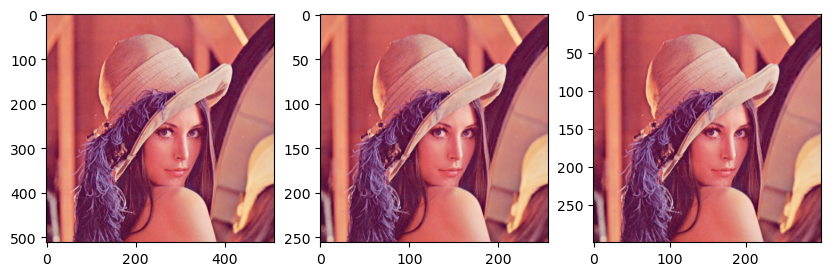

In [12]:
# 3.3. Show Image on suplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 10))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(resized_img1, cv2.COLOR_BGR2RGB))
ax3.imshow(cv2.cvtColor(resized_img2, cv2.COLOR_BGR2RGB))
plt.show()

In [14]:
print(img.shape)
print(resized_img1.shape)
print(resized_img2.shape)

(512, 512, 3)
(256, 256, 3)
(300, 300, 3)


## 4. Copy an image (Cloning)

In [15]:
## WARNING !!!! 
# DO NOT USE: 
#      img_clone = img
# It will point 'img' to 'img_clone'
img_clone = img.copy()

## 5. Accessing Pixels

In [16]:
# 5.1. Accessing a pixel #1
px = img[100,100]
print(px)

[ 78  68 178]


In [17]:
# 5.2. Accessing a pixel #2
px_blue = img[100,100, 0]
print(px_blue)

78


## 6. Image Region Of Interest (ROI)

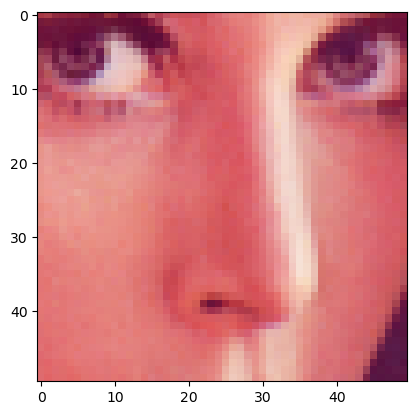

In [18]:
# 6. Image ROI
roi = resized_img2[150:200, 150:200]
roi.shape

# display the image
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)) 
plt.show()

## 7. Editing Pixels

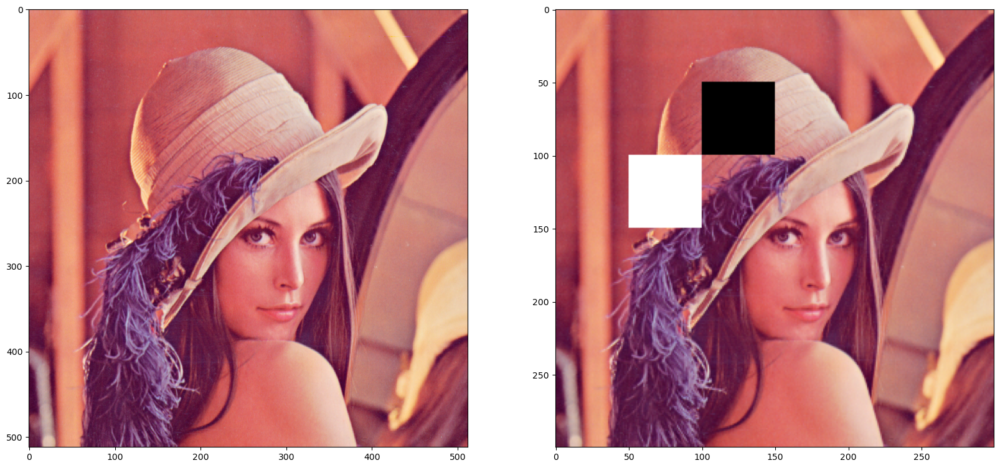

In [19]:
# 7. Editing Pixels
img_edited = resized_img2.copy()     ## Again, be careful when you copy an image/matrix in OpenCV

#Edit pixel from range
img_edited[50:100, 100:150] = [0,0,0] 
img_edited[100:150, 50:100] = 255

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(img_edited, cv2.COLOR_BGR2RGB))
plt.show()

## 8. Split & Merge Channels

In [20]:
# 8.1. Split Channels #1
img_b,img_g,img_r = cv2.split(img)

(512, 512, 3)
(512, 512)
(512, 512)
(512, 512)


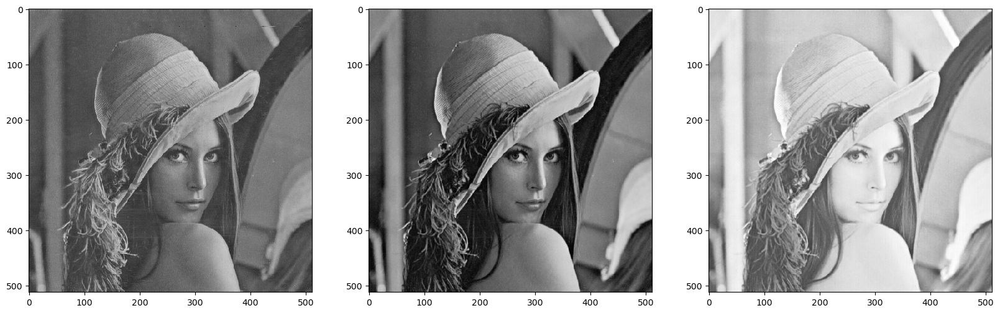

In [21]:
# 8.3. Check Outputs
print(img.shape)
print(img_b.shape)
print(img_g.shape)
print(img_r.shape)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_b, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_g, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_r, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Alternatively, you can also try to split matrix by:

In [22]:
# 8.2. Split Channels #2
img_b = img[:,:,0].copy()
img_g = img[:,:,1].copy()
img_r = img[:,:,2].copy()

print(img.shape)
print(img_b.shape)
print(img_g.shape)
print(img_r.shape)

(512, 512, 3)
(512, 512)
(512, 512)
(512, 512)


(512, 512, 3)
(512, 512)
(512, 512)
(512, 512)


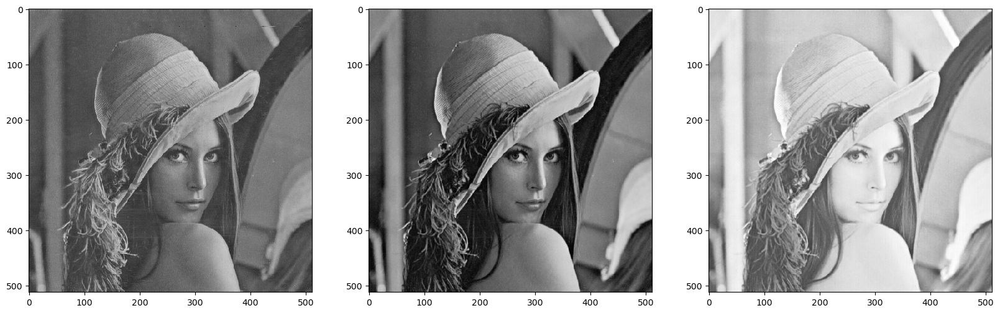

In [23]:
# 8.3. Check Outputs
print(img.shape)
print(img_b.shape)
print(img_g.shape)
print(img_r.shape)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_b, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_g, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_r, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

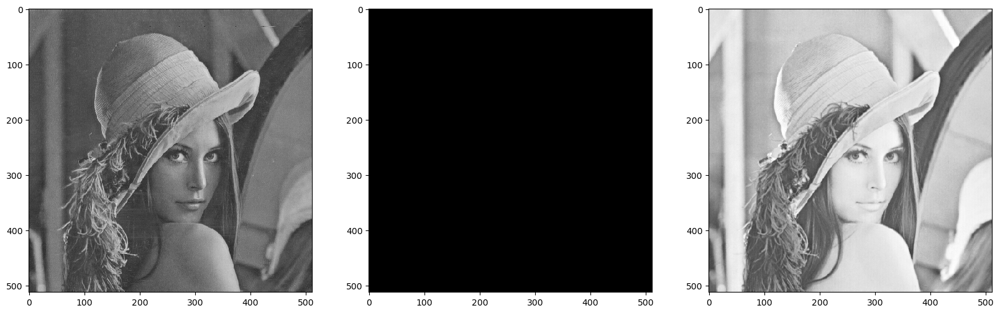

In [24]:
# Try to edit every pixel to be zero !
img_g[:,:] = 0

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_b, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_g, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_r, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

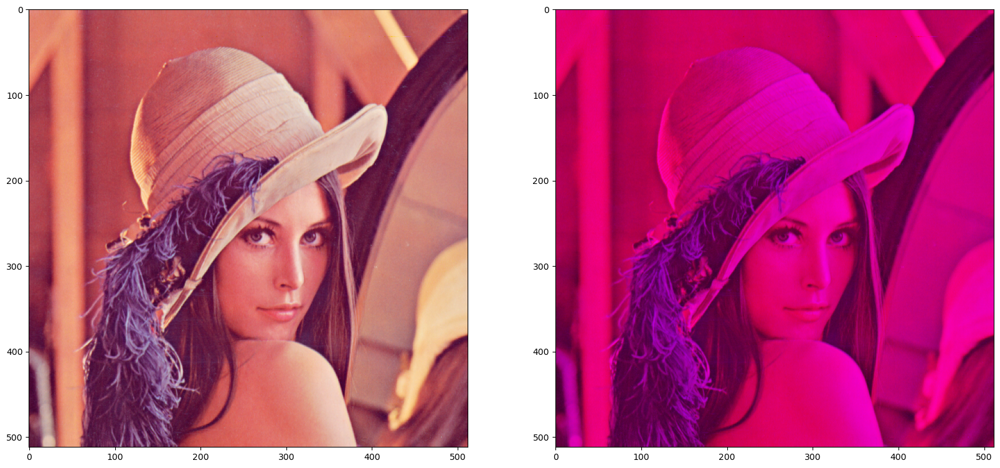

In [25]:
# 8.4. Merge Channels
img_merged = cv2.merge([img_b,img_g, img_r])

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(img_merged, cv2.COLOR_BGR2RGB))
plt.show()


## 9. Color Conversion

9.1. BGR -> HSV

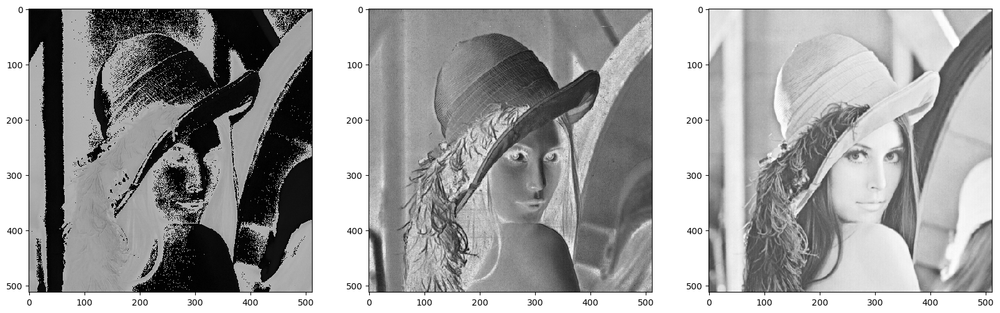

In [26]:
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 

img_h = img_hsv[:,:,0].copy() #Hue
img_s = img_hsv[:,:,1].copy() #Saturation
img_v = img_hsv[:,:,2].copy() #Value

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_h, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_s, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_v, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

9.2. BGR -> Lab

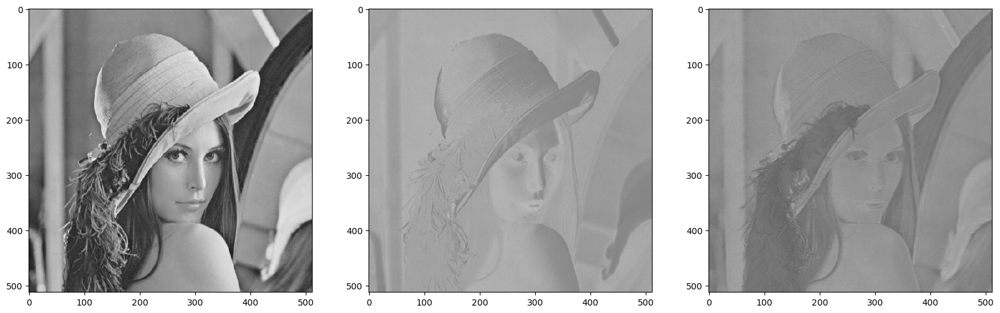

In [27]:
img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab) 

img_l = img_lab[:,:,0].copy() #lumination
img_a = img_lab[:,:,1].copy()
img_b = img_lab[:,:,2].copy()

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_l, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_a, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_b, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## 10. Visualization

### 10.1. Histogram of a grayscale image

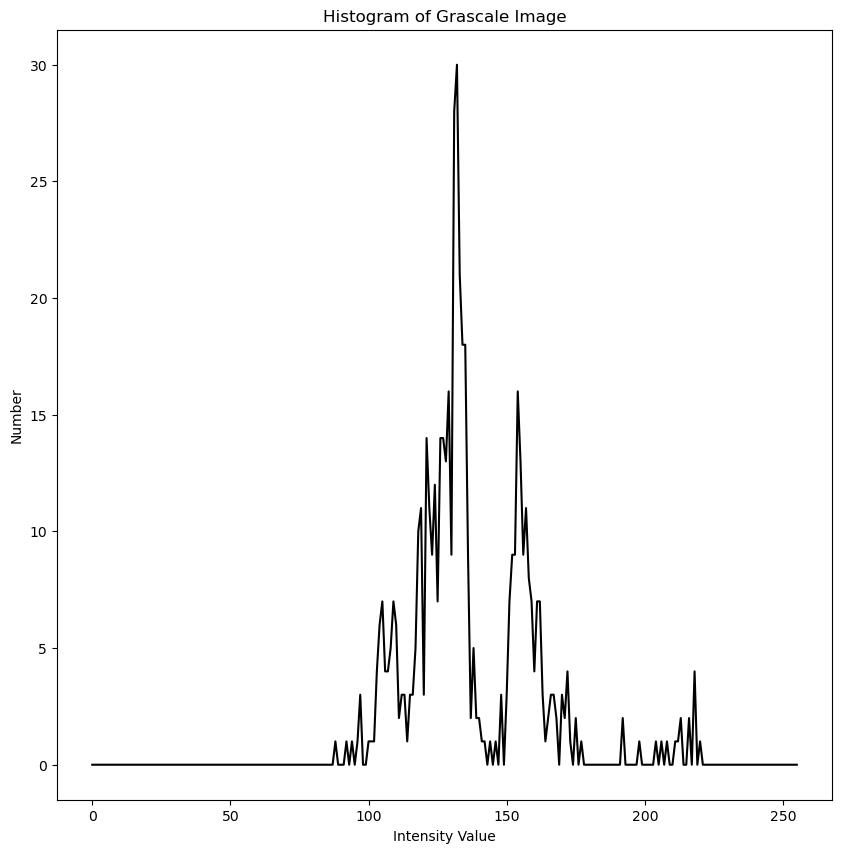

In [28]:
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])

# Plot Histogram
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_gray, color='k')
plt.title('Histogram of Grascale Image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()

### 10.2. Histogram of each BGR image plane

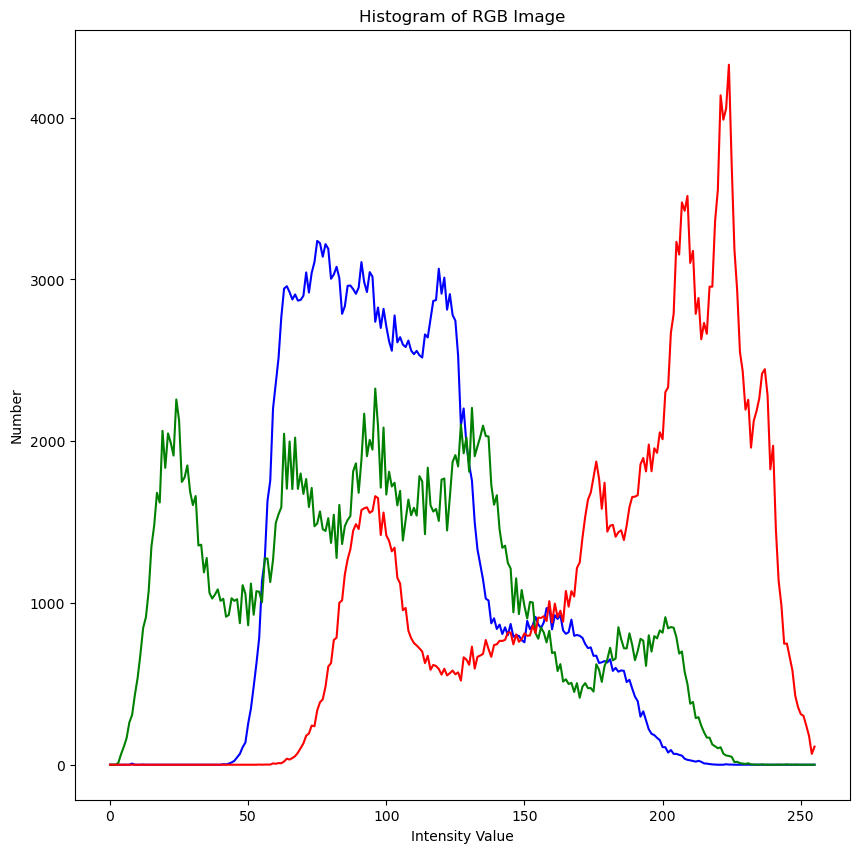

In [29]:
# Histogram of each BGR image plane
histogram_b = cv2.calcHist([img], [0], None, [256], [0, 256])
histogram_g = cv2.calcHist([img], [1], None, [256], [0, 256])
histogram_r = cv2.calcHist([img], [2], None, [256], [0, 256])

fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_b, color='b')
plt.plot(histogram_g, color='g')
plt.plot(histogram_r, color='r')
plt.title('Histogram of RGB Image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()

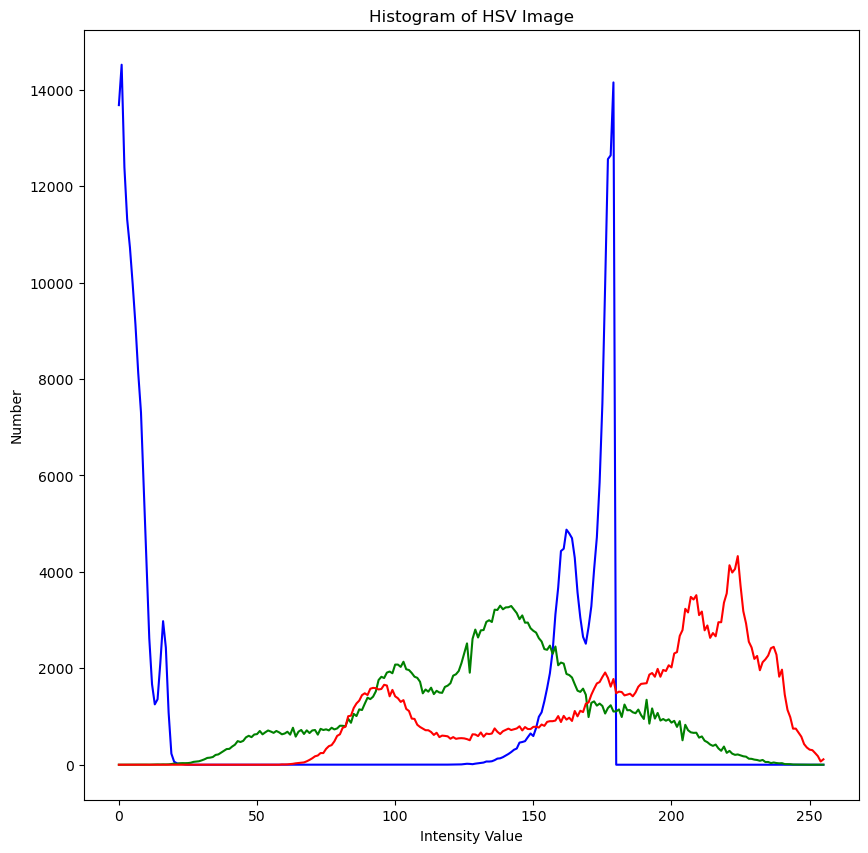

In [30]:
# Histogram of each HSV image plane
histogram_h = cv2.calcHist([img_hsv], [0], None, [256], [0, 256])
histogram_s = cv2.calcHist([img_hsv], [1], None, [256], [0, 256])
histogram_v = cv2.calcHist([img_hsv], [2], None, [256], [0, 256])

fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_h, color='b')
plt.plot(histogram_s, color='g')
plt.plot(histogram_v, color='r')
plt.title('Histogram of HSV Image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()

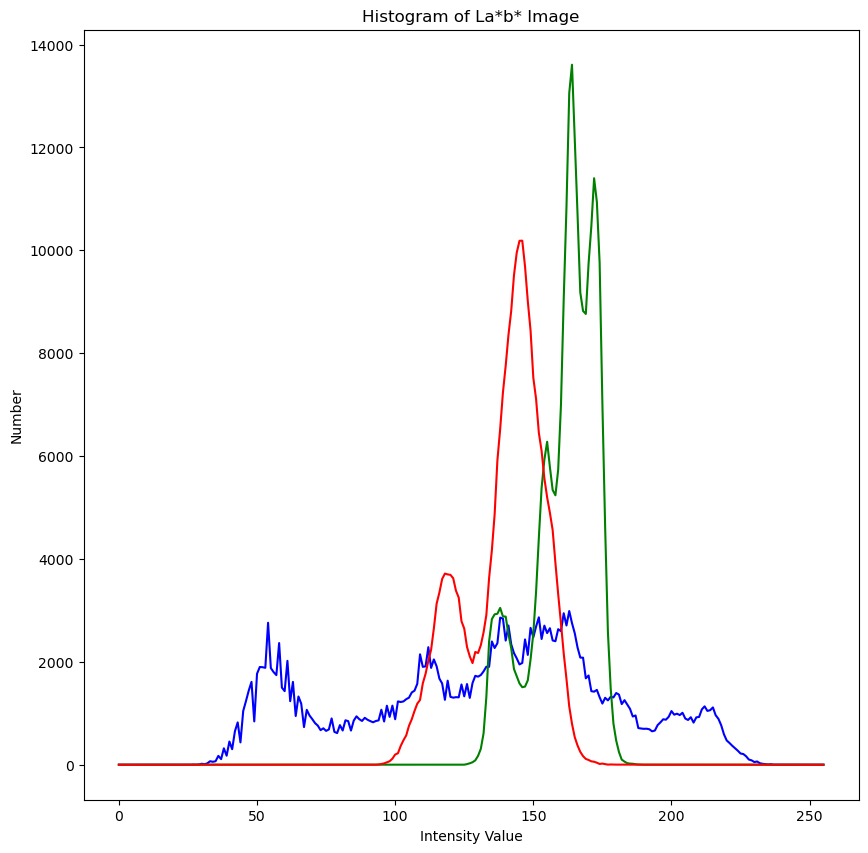

In [31]:
# Histogram of each L*a*b* image plane
histogram_l = cv2.calcHist([img_lab], [0], None, [256], [0, 256])
histogram_a = cv2.calcHist([img_lab], [1], None, [256], [0, 256])
histogram_b = cv2.calcHist([img_lab], [2], None, [256], [0, 256])

fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_l, color='b')
plt.plot(histogram_a, color='g')
plt.plot(histogram_b, color='r')
plt.title('Histogram of La*b* Image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()

### 10.3. Scatter Plot 2D

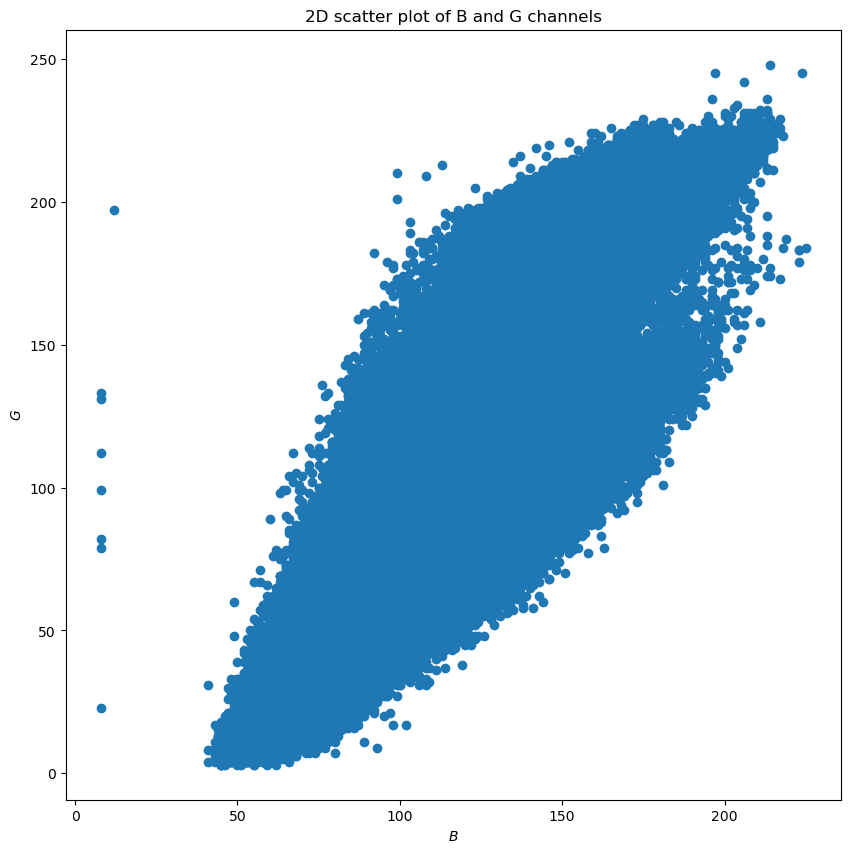

In [32]:
# plot scatter plot over B and G
pixel_rgb_values = img.reshape((-1, 3))

fig = plt.subplots(1, 1, figsize=(10, 10))
plt.scatter(pixel_rgb_values[:,0], pixel_rgb_values[:,1])
plt.xlabel('$B$', fontsize=10)
plt.ylabel('$G$', fontsize=10)
plt.title('2D scatter plot of B and G channels')
plt.show()

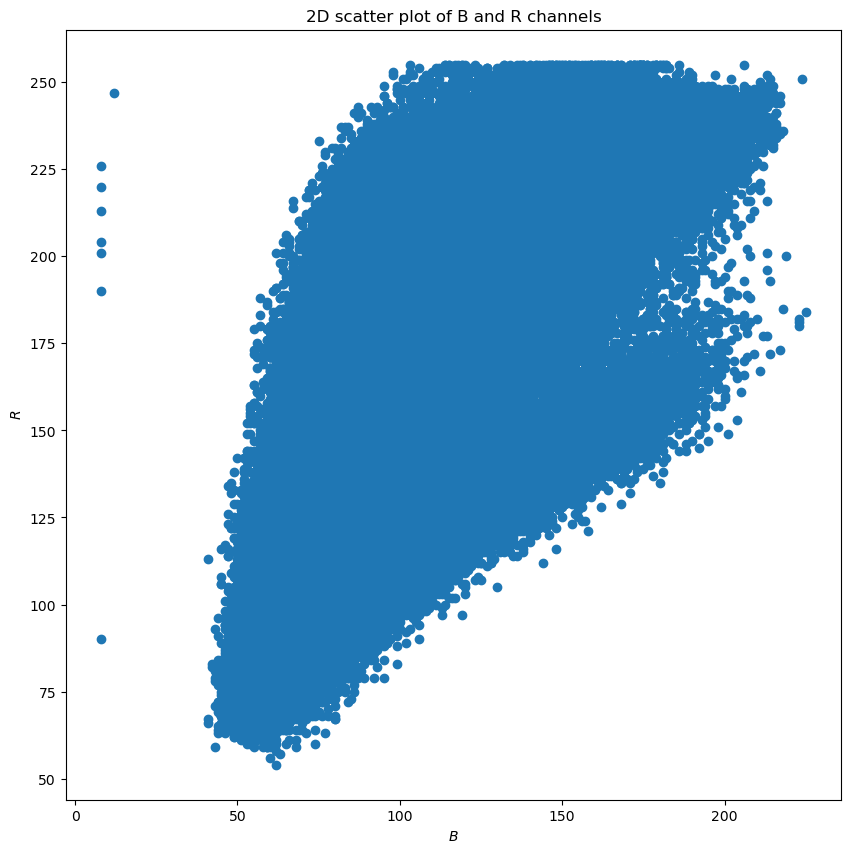

In [33]:
# plot scatter plot over B and R
pixel_rgb_values = img.reshape((-1, 3))

fig = plt.subplots(1, 1, figsize=(10, 10))
plt.scatter(pixel_rgb_values[:,0], pixel_rgb_values[:,2])
plt.xlabel('$B$', fontsize=10)
plt.ylabel('$R$', fontsize=10)
plt.title('2D scatter plot of B and R channels')
plt.show()

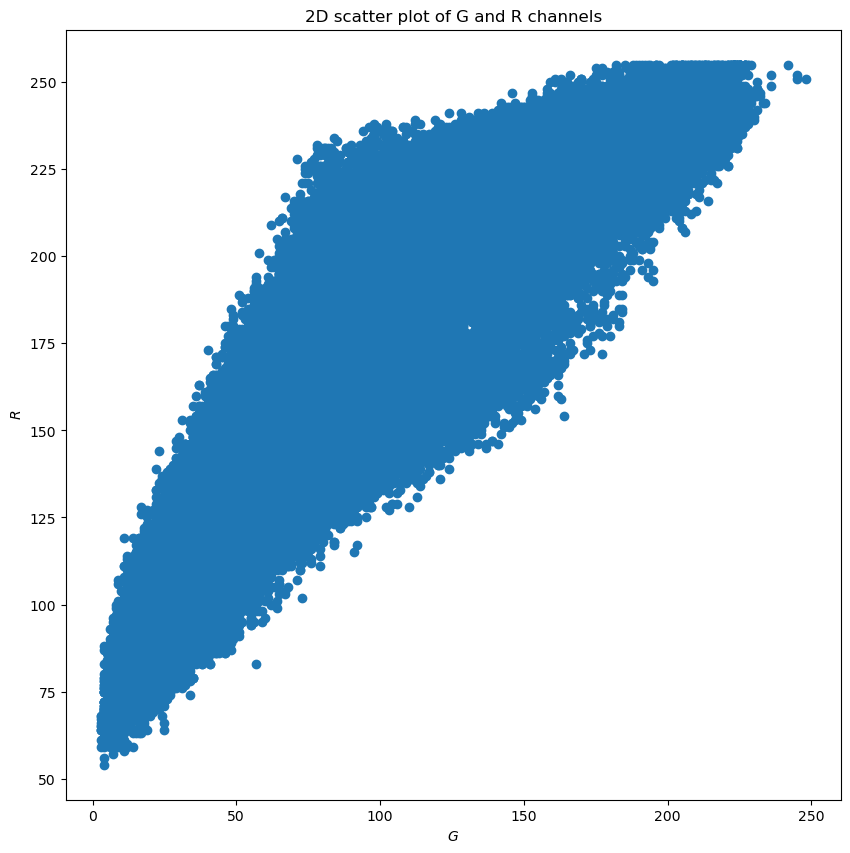

In [34]:
# plot scatter plot over G and R
pixel_rgb_values = img.reshape((-1, 3))

fig = plt.subplots(1, 1, figsize=(10, 10))
plt.scatter(pixel_rgb_values[:,1], pixel_rgb_values[:,2])
plt.xlabel('$G$', fontsize=10)
plt.ylabel('$R$', fontsize=10)
plt.title('2D scatter plot of G and R channels')
plt.show()

### Scatter plot 3D

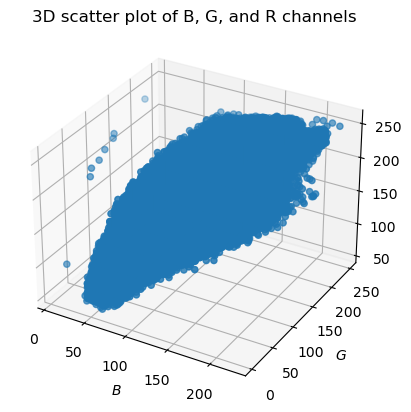

In [35]:
# plot scatter plot of RGB
pixel_rgb_values = img.reshape((-1, 3))

fig1 = plt.figure()
ax1 = fig1.add_subplot(111, projection='3d')
ax1.scatter(pixel_rgb_values[:,0], pixel_rgb_values[:,1], pixel_rgb_values[:,2])
ax1.set_xlabel('$B$', fontsize=10)
ax1.set_ylabel('$G$', fontsize=10)
ax1.set_zlabel('$R$', fontsize=10)
ax1.set_title('3D scatter plot of B, G, and R channels')
plt.show()

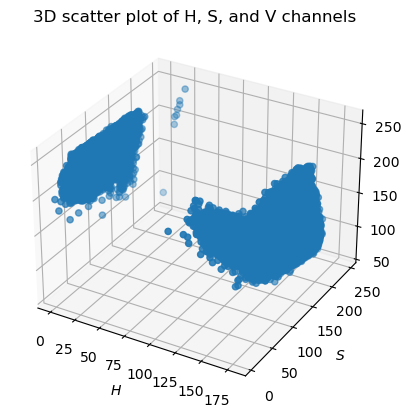

In [36]:
# plot scatter plot of HSV
pixel_hsv_values = img_hsv.reshape((-1, 3))

fig1 = plt.figure()
ax1 = fig1.add_subplot(111, projection='3d')
ax1.scatter(pixel_hsv_values[:,0], pixel_hsv_values[:,1], pixel_hsv_values[:,2])
ax1.set_xlabel('$H$', fontsize=10)
ax1.set_ylabel('$S$', fontsize=10)
ax1.set_zlabel('$V$', fontsize=10)
ax1.set_title('3D scatter plot of H, S, and V channels')
plt.show()

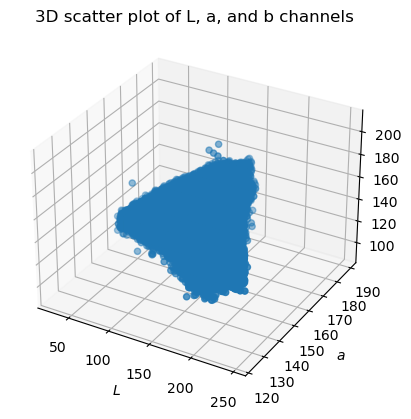

In [37]:
# plot scatter plot of Lab
pixel_lab_values = img_lab.reshape((-1, 3))

fig1 = plt.figure()
ax1 = fig1.add_subplot(111, projection='3d')
ax1.scatter(pixel_lab_values[:,0], pixel_lab_values[:,1], pixel_lab_values[:,2])
ax1.set_xlabel('$L$', fontsize=10)
ax1.set_ylabel('$a$', fontsize=10)
ax1.set_zlabel('$b$', fontsize=10)
ax1.set_title('3D scatter plot of L, a, and b channels')
plt.show()

In [38]:
# Assignment 1

In [39]:
# Assigment 2